# Conversion rate project

In [62]:


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, RobustScaler
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, BaggingClassifier, VotingClassifier, StackingClassifier
from sklearn.svm import SVC
from sklearn.metrics import f1_score, ConfusionMatrixDisplay
from sklearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTENC

from xgboost import XGBClassifier

import plotly.express as px
import seaborn as sns



Le projet vise à former des modèles de machine learning supervisé pour prédire si un utilisateur de site web se convertira ou non en s'abonnant à la newsletter, impliquant une classification binaire. Il se déroule dans le cadre d'une compétition interne où différents modèles sont comparés pour obtenir les meilleures prédictions sur un ensemble de données non étiquetées. La métrique F1 score est utilisée en raison du déséquilibre élevé entre les conversions et les non-conversions, rendant l'exactitude peu représentative.

# EDA

In [63]:


data = pd.read_csv('data/conversion_data_train.csv')
print('\n data shape : \n', data.shape)
print('\n data.head(): \n', data.head())
print('\n data.describe: \n', data.describe(include='all'))
data.info()


 data shape : 
 (284580, 6)

 data.head(): 
    country  age  new_user  source  total_pages_visited  converted
0    China   22         1  Direct                    2          0
1       UK   21         1     Ads                    3          0
2  Germany   20         0     Seo                   14          1
3       US   23         1     Seo                    3          0
4       US   28         1  Direct                    3          0

 data.describe: 
        country            age       new_user  source  total_pages_visited  \
count   284580  284580.000000  284580.000000  284580        284580.000000   
unique       4            NaN            NaN       3                  NaN   
top         US            NaN            NaN     Seo                  NaN   
freq    160124            NaN            NaN  139477                  NaN   
mean       NaN      30.564203       0.685452     NaN             4.873252   
std        NaN       8.266789       0.464336     NaN             3.341995   


In [64]:
data.isnull().sum()

country                0
age                    0
new_user               0
source                 0
total_pages_visited    0
converted              0
dtype: int64

Nous n'avons pas de valeurs manquantes.

converted
0    275400
1      9180
Name: count, dtype: int64


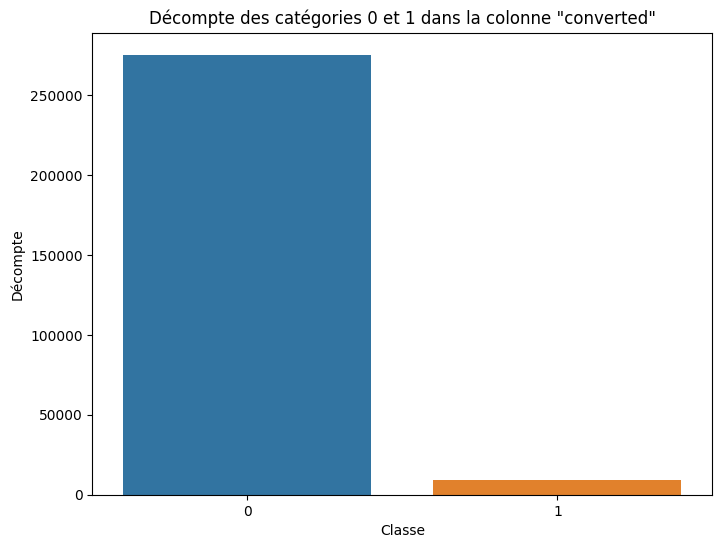

In [65]:
# Compter les occurrences de chaque classe dans la colonne "converted"
counts = data['converted'].value_counts()
print(counts)
# Créer un graphique à barres pour afficher les décomptes
plt.figure(figsize=(8, 6))
sns.barplot(x=counts.index, y=counts.values)

# Ajouter des étiquettes et un titre au graphique
plt.xlabel('Classe')
plt.ylabel('Décompte')
plt.title('Décompte des catégories 0 et 1 dans la colonne "converted"')

# Afficher le graphique
plt.show()


Les catégories de la classe "converted" dans notre ensemble de données sont très déséquilibrées, avec la classe 0 représentant la grande majorité des observations (275,400) par rapport à la classe 1 (9,180). Le fait d'avoir seulement deux classes possibles ("0" et "1") dans la colonne "converted" indique qu'il s'agit d'un problème de classification binaire.


On génère quatre graphiques différents pour visualiser comment la colonne "converted" est liée aux autres variables de notre ensemble de données

- Un graphique à barres montrant la conversion en fonction de la source.
- Un graphique à barres montrant la conversion en fonction du pays.
- Un graphique en boîte montrant la distribution de l'âge pour les convertis et les non convertis.
- Un graphique en boîte montrant la distribution du nombre total de pages visitées pour les convertis et les non convertis.



## Distributions des variables

In [66]:
fig = px.histogram(data,'age',marginal='box')
fig.show()

La distribution de la variable numérique 'age' présente une forme qui ressemble à une distribution normale, mais elle est tronquée sur le côté gauche, ce qui signifie qu'elle est assez uniforme sauf pour la partie tronquée. Il est probable que certaines valeurs d'âge soient des valeurs aberrantes comme par exemple, des utlisateurs âgés de plus 100 ans qui semblent peu probables.

In [67]:
fig = px.histogram(data,'total_pages_visited',marginal='box')
fig.show()

La variable "total_pages_visited" reseemble à la variable "age" et suit une distribution qui ressemble à une distribution normale tronquée à gauche, avec quelques valeurs aberrantes importantes au-delà de 15. 

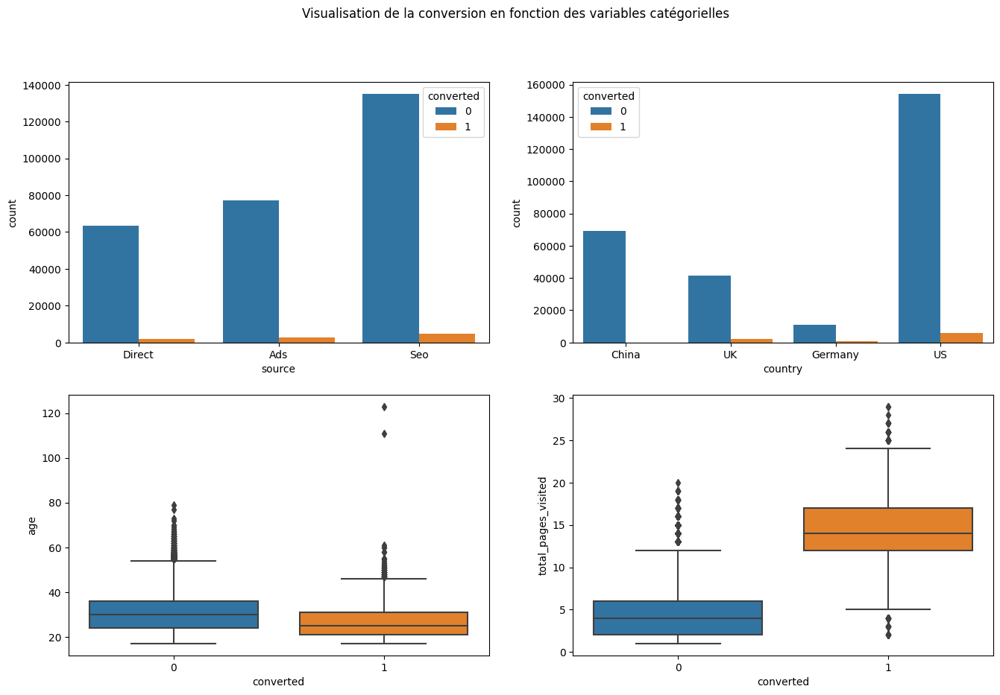

In [68]:
# Définir la taille des graphiques
plt.figure(figsize=(16, 10))

# Utiliser un sous-tracé (subplot) pour afficher plusieurs graphiques

# Graphique 1 : Conversion en fonction de la source
plt.subplot(2, 2, 1)
sns.countplot(x='source', hue='converted', data=data)

# Graphique 2 : Conversion en fonction du pays
plt.subplot(2, 2, 2)
sns.countplot(x='country', hue='converted', data=data)

# Graphique 3 : Distribution de l'âge pour les convertis et les non convertis
plt.subplot(2, 2, 3)
sns.boxplot(x='converted', y='age', data=data)

# Graphique 4 : Distribution du nombre total de pages visitées pour les convertis et les non convertis
plt.subplot(2, 2, 4)
sns.boxplot(x='converted', y='total_pages_visited', data=data)

# Ajouter des titres pour chaque graphique
plt.suptitle('Visualisation de la conversion en fonction des variables catégorielles')

# Afficher les graphiques
plt.show()

On remarque une grande majorité d'utilisateurs qui ont effectué une recherche sur un moteur de recherche comme Google, Bing, ou Yahoo, et qui ont cliqué sur un résultat de recherche qui les a dirigés vers le site. 
Il n'y a que des conversions de newletters en Chine et nous remarquons que les états unis sont ceux qui bénéficient du meilleur taux de conversion.
Il n'y a pas une grande différence entre la distribution de l'âge des utilisateurs convertis et non convertis.
Il semble y avoir une différence plus significative entre le nombre total de pages visitées des utilisateurs convertis et non convertis

## Preprocessing

On crée un nouveau dataframe en retirant les observations avec un âge de 90 ans ou moins et un nombre de pages visitées de 15 ou moins.

In [69]:
# Filtre pour retirer les outliers d'âge (âge > 90) et de nombre de pages visitées (pages > 15)
data = data[(data['age'] <= 90) & (data['total_pages_visited'] <= 15)]

# Afficher les premières lignes du dataframe après avoir retiré les outliers
print(data.head())
data.shape

   country  age  new_user  source  total_pages_visited  converted
0    China   22         1  Direct                    2          0
1       UK   21         1     Ads                    3          0
2  Germany   20         0     Seo                   14          1
3       US   23         1     Seo                    3          0
4       US   28         1  Direct                    3          0


(280657, 6)

284580  − 280657 = 3923 ont été retirés du dataset

Le dataset a beaucoup de lignes comparé au nombre de colonnes.
Nous allons prendre en compte l'intéfralité des colonnes pour constuire notre modèle.

In [70]:
colonnes=['country', 'new_user', 'source', 'total_pages_visited','age']
X=data[colonnes]
Y=data['converted']

On divise d'abord les données en ensembles d'entraînement et de test, puis on prétraite les caractéristiques en utilisant RobustScaler pour les caractéristiques numériques et OneHotEncoder pour les caractéristiques catégorielles, afin de les préparer pour un modèle d'apprentissage automatique.
Etant donné que j'ai des doutes sur le seuil de suppression des outliers et qu'il pourrait y avoir des valeurs aberrantes non détectées, il peut être judicieux de conserver une méthode robuste comme RobustScaler pour être sûr de ne pas être affecté par d'éventuelles valeurs aberrantes résiduelles.

In [71]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.1, random_state=12)


numeric_features = ['age','total_pages_visited']
categorical_features = ['country','new_user','source']
feature_names = numeric_features + categorical_features
print(feature_names)
preprocessor = ColumnTransformer(
    transformers=[
        ('num',RobustScaler(),numeric_features),
        ('cat',OneHotEncoder(drop='first'),categorical_features)
    ]
)



X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)



['age', 'total_pages_visited', 'country', 'new_user', 'source']


In [72]:
print(X_train)

[[ 0.41666667  0.5         0.         ...  0.          0.
   1.        ]
 [-0.25        0.          0.         ...  1.          1.
   0.        ]
 [-0.25       -0.75        0.         ...  1.          0.
   0.        ]
 ...
 [ 0.5         0.25        0.         ...  1.          1.
   0.        ]
 [-0.91666667  0.75        0.         ...  1.          0.
   0.        ]
 [-1.         -0.5         0.         ...  1.          0.
   1.        ]]


### chargement des données sans label

In [82]:
data_without_labels = pd.read_csv('./data/conversion_data_test.csv')
X_without_labels = data_without_labels.loc[:, colonnes]

X_without_labels = preprocessor.transform(X_without_labels)
print("...Done")
print(X_without_labels[0:5,:])



...Done
[[-0.16666667  3.          0.          1.          0.          0.
   0.          1.        ]
 [-0.66666667  0.25        0.          1.          0.          1.
   1.          0.        ]
 [ 0.16666667 -0.75        0.          0.          0.          1.
   0.          1.        ]
 [ 0.16666667  0.5         0.          0.          1.          1.
   0.          0.        ]
 [-0.41666667 -0.25        0.          0.          0.          0.
   0.          1.        ]]


### Application d'un modèle de base: regression logistique

Train model...


...Done.
Predictions on training set...
...Done.
[0 0 0 ... 0 0 0]

Probabilities on training set...
...Done.
[[9.94352881e-01 5.64711901e-03]
 [9.99667251e-01 3.32749314e-04]
 [9.99958122e-01 4.18777806e-05]
 ...
 [9.99635089e-01 3.64910898e-04]
 [9.92830866e-01 7.16913407e-03]
 [9.99829549e-01 1.70450799e-04]]

Predictions on test set...
...Done.
[0 0 0 ... 0 0 0]

Probabilities on test set...
...Done.
[[9.99957956e-01 4.20442210e-05]
 [9.93476715e-01 6.52328504e-03]
 [9.99690078e-01 3.09922314e-04]
 ...
 [9.99894301e-01 1.05699480e-04]
 [9.99999277e-01 7.23316816e-07]
 [9.88138125e-01 1.18618750e-02]]

f1-score on training set :  0.5896962990286487
f1-score on test set :  0.5497737556561085



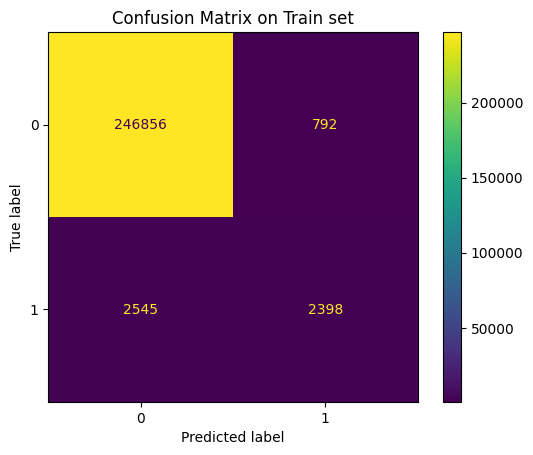

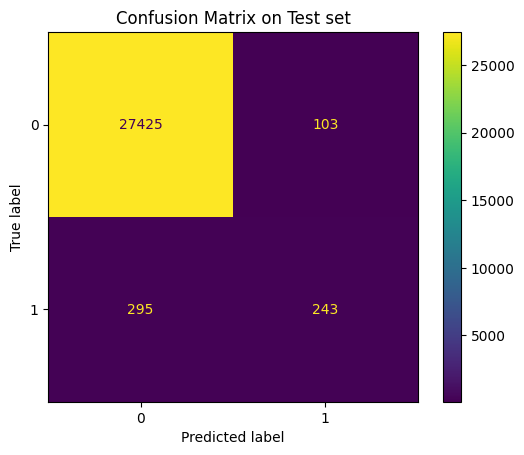

f1_score mean for train set :0.5888592138118323
f1_score std for train set :0.012027748923671385
f1_score mean for train set :0.5337856275245259
f1_score std for train set :0.02005670278128925


In [87]:
# Train model
print("Train model...")
classifier = LogisticRegression()
classifier.fit(X_train, Y_train)
print("...Done.")
# Predictions on training set
print("Predictions on training set...")
Y_train_pred = classifier.predict(X_train)
print("...Done.")
print(Y_train_pred)
print()

# It's also possible to get the probabilities estimated by the model:
print("Probabilities on training set...")
Y_train_proba = classifier.predict_proba(X_train)
print("...Done.")
print(Y_train_proba)
print()

# Predictions on test set
print("Predictions on test set...")
Y_test_pred = classifier.predict(X_test)
print("...Done.")
print(Y_test_pred)
print()

# It's also possible to get the probabilities estimated by the model:
print("Probabilities on test set...")
Y_test_proba = classifier.predict_proba(X_test)
print("...Done.")
print(Y_test_proba)
print()



print("f1-score on training set : ", f1_score(Y_train, Y_train_pred))
print("f1-score on test set : ", f1_score(Y_test, Y_test_pred))
print()
# Visualize confusion matrices
_ , ax = plt.subplots() # Get subplot from matplotlib
ax.set(title="Confusion Matrix on Train set") # Set a title that we will add into ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(classifier, X_train, Y_train, ax=ax) # ConfusionMatrixDisplay from sklearn
plt.show()

_ , ax = plt.subplots() # Get subplot from matplotlib
ax.set(title="Confusion Matrix on Test set") # Set a title that we will add into ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(classifier, X_test, Y_test, ax=ax) # ConfusionMatrixDisplay from sklearn
plt.show()

scores_train=cross_val_score(classifier,X_train,Y_train,scoring='f1',cv=5)
print(f"f1_score mean for train set :{scores_train.mean()}")
print(f"f1_score std for train set :{scores_train.std()}")


scores_test=cross_val_score(classifier,X_test,Y_test,scoring='f1',cv=5)
print(f"f1_score mean for train set :{scores_test.mean()}")
print(f"f1_score std for train set :{scores_test.std()}")

La moyenne des scores F1 sur l'ensemble d'entraînement est d'environ 0.589. Cela indique que, en moyenne, notre modèle a une bonne capacité à bien classer les exemples positifs et négatifs dans l'ensemble d'entraînement. Le score F1 est une mesure de la précision du modèle, prenant en compte à la fois la précision (capacité à classer correctement les exemples positifs) et le rappel (capacité à retrouver tous les exemples positifs). Un score F1 élevé est souhaitable.

L'écart-type des scores F1 sur l'ensemble d'entraînement est faible (environ 0.012). Cela suggère que les performances de notre modèle sur l'ensemble d'entraînement sont cohérentes, avec peu de variation entre les plis de la validation croisée. C'est un bon signe car cela signifie que votre modèle est stable lors de l'entraînement sur différentes parties de l'ensemble d'entraînement.

La moyenne des scores F1 sur l'ensemble de test est d'environ 0.534. Cela indique que notre modèle a également une capacité raisonnable à bien classer les exemples positifs et négatifs sur l'ensemble de test. Cependant, il est légèrement inférieur à la performance sur l'ensemble d'entraînement, ce qui est attendu car les modèles ont tendance à mieux s'adapter aux données d'entraînement.

L'écart-type des scores F1 sur l'ensemble de test est légèrement plus élevé (environ 0.020) par rapport à l'ensemble d'entraînement. Cela suggère une légère variation des performances entre les plis de la validation croisée sur l'ensemble de test, mais cette variation reste raisonnablement faible.


les matrices de confusion sont assez équilibrée, avec tout de même un peu plus de faux-négatifs que de faux-positifs.

### application du modèle de base sur dataset sans label

In [88]:
# Faire des prédictions sur les données de test
predictions = classifier.predict(X_without_labels)

# Vous pouvez également obtenir les probabilités associées aux classes en utilisant predict_proba
# proba_predictions = model.predict_proba(features)

# Enregistrez les prédictions dans un fichier CSV (changez le nom du fichier de sortie selon vos besoins)
output_df = pd.DataFrame({'predictions': predictions})
output_df.to_csv('predictions_logistic_regression.csv', index=False)

## regression logistique avec gridsearh

Grid search...


/home/amandine/mambaforge/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:425: FitFailedWarning:


54 fits failed out of a total of 216.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
54 fits failed with the following error:
Traceback (most recent call last):
  File "/home/amandine/mambaforge/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/amandine/mambaforge/lib/python3.10/site-packages/sklearn/base.py", line 1151, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/home/amandine/mambaforge/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py", line 1168, in fit
    solver = _

...Done.
Best hyperparameters :  {'C': 1, 'max_iter': 100, 'penalty': 'l1', 'solver': 'liblinear'}
Best validation accuracy :  0.986777042729155
Predictions on training set...
...Done.
[0 0 0 ... 0 0 0]

Predictions on test set...
...Done.
[0 0 0 ... 0 0 0]

f1_score mean for train set :0.5896605098053523
f1_score std for train set :0.011126338061605508
f1_score mean for train set :0.5342769348049894
f1_score std for train set :0.022521428832640505


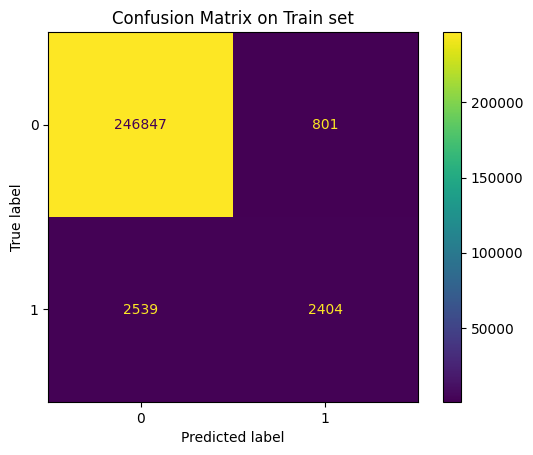

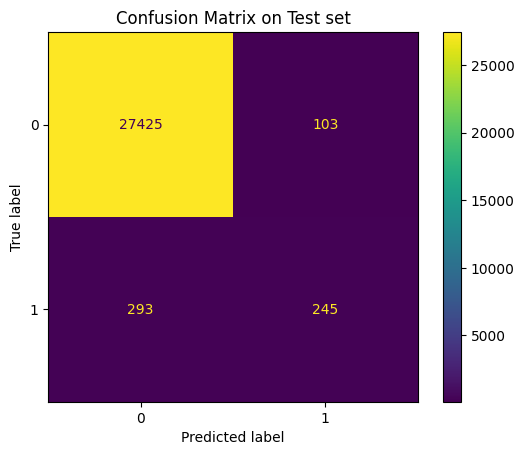

In [89]:
# Perform grid search
print("Grid search...")
classifier = LogisticRegression()


param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],  # Hyperparamètre de régularisation
    'penalty': ['l1', 'l2'],  # Type de régularisation (L1 ou L2)
    'solver': ['liblinear', 'lbfgs'],  # L'optimiseur à utiliser (pour 'l1' penalty, 'liblinear' est couramment utilisé)
    'max_iter': [100, 200, 300]  # Nombre maximum d'itérations
}
gridsearch = GridSearchCV(classifier, param_grid = param_grid, cv = 3) # cv : the number of folds to be used for CV
gridsearch.fit(X_train, Y_train)
print("...Done.")
print("Best hyperparameters : ", gridsearch.best_params_)
print("Best validation accuracy : ", gridsearch.best_score_)
# Predictions on training set
print("Predictions on training set...")
Y_train_pred = gridsearch.predict(X_train)
print("...Done.")
print(Y_train_pred)
print()

# Predictions on test set
print("Predictions on test set...")
Y_test_pred = gridsearch.predict(X_test)
print("...Done.")
print(Y_test_pred)
print()
print(gridsearch.best_estimator_)
scores_train=cross_val_score(gridsearch.best_estimator_,X_train,Y_train,scoring='f1',cv=5)
print(f"f1_score mean for train set :{scores_train.mean()}")
print(f"f1_score std for train set :{scores_train.std()}")


scores_test=cross_val_score(gridsearch.best_estimator_,X_test,Y_test,scoring='f1',cv=5)
print(f"f1_score mean for test set :{scores_test.mean()}")
print(f"f1_score std for test set :{scores_test.std()}")

# Visualize confusion matrices
_ , ax = plt.subplots() # Get subplot from matplotlib
ax.set(title="Confusion Matrix on Train set") # Set a title that we will add into ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(gridsearch, X_train, Y_train, ax=ax) # ConfusionMatrixDisplay from sklearn
plt.show()

_ , ax = plt.subplots() # Get subplot from matplotlib
ax.set(title="Confusion Matrix on Test set") # Set a title that we will add into ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(gridsearch, X_test, Y_test, ax=ax) # ConfusionMatrixDisplay from sklearn
plt.show()



In [90]:
# Faire des prédictions sur les données de test
predictions = gridsearch.best_estimator_.predict(X_without_labels)

# Vous pouvez également obtenir les probabilités associées aux classes en utilisant predict_proba
# proba_predictions = model.predict_proba(features)

# Enregistrez les prédictions dans un fichier CSV (changez le nom du fichier de sortie selon vos besoins)
output_df = pd.DataFrame({'predictions': predictions})
output_df.to_csv('predictions_logistic_regression_grid_search.csv', index=False)

## Decision tree

In [91]:
# Perform grid search
print("Grid search...")
classifier = DecisionTreeClassifier()

# Grid of values to be tested
params = {
    'max_depth': [4, 6, 8, 10],
    'min_samples_leaf': [1, 2, 5],
    'min_samples_split': [2, 4, 8]
}
gridsearch = GridSearchCV(classifier, param_grid = params, cv = 3) # cv : the number of folds to be used for CV
gridsearch.fit(X_train, Y_train)
print("...Done.")
print("Best hyperparameters : ", gridsearch.best_params_)
print("Best validation accuracy : ", gridsearch.best_score_)
print("f1-score on training set : ", f1_score(Y_train, Y_train_pred))
print("f1-score on test set : ", f1_score(Y_test, Y_test_pred))
print()

Grid search...


...Done.
Best hyperparameters :  {'max_depth': 8, 'min_samples_leaf': 1, 'min_samples_split': 4}
Best validation accuracy :  0.986195074250468
f1-score on training set :  0.5900834560628375
f1-score on test set :  0.5530474040632055



Predictions on training set...
...Done.
[0 0 0 ... 0 0 0]

Predictions on test set...
...Done.
[0 0 0 ... 0 0 0]



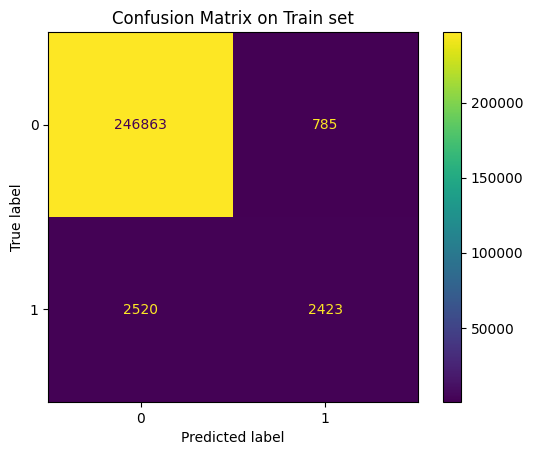

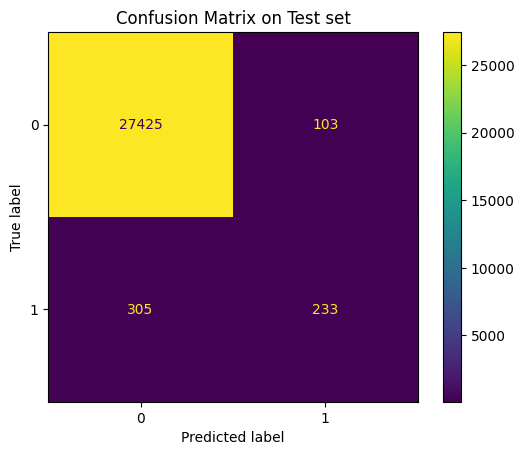

In [92]:
# Predictions on training set
print("Predictions on training set...")
Y_train_pred = gridsearch.predict(X_train)
print("...Done.")
print(Y_train_pred)
print()

# Predictions on test set
print("Predictions on test set...")
Y_test_pred = gridsearch.predict(X_test)
print("...Done.")
print(Y_test_pred)
print()
# Visualize confusion matrices
_ , ax = plt.subplots() # Get subplot from matplotlib
ax.set(title="Confusion Matrix on Train set") # Set a title that we will add into ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(gridsearch, X_train, Y_train, ax=ax) # ConfusionMatrixDisplay from sklearn
plt.show()

_ , ax = plt.subplots() # Get subplot from matplotlib
ax.set(title="Confusion Matrix on Test set") # Set a title that we will add into ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(gridsearch, X_test, Y_test, ax=ax) # ConfusionMatrixDisplay from sklearn
plt.show()

Les matrices de confusions donnent des résultat similaires avec ceux de la regression logistique

In [94]:
scores_train=cross_val_score(classifier,X_train,Y_train,scoring='f1',cv=5)
print(f"f1_score mean for train set :{scores_train.mean()}")
print(f"f1_score std for train set :{scores_train.std()}")


scores_test=cross_val_score(classifier,X_test,Y_test,scoring='f1',cv=5)
print(f"f1_score mean for train set :{scores_test.mean()}")
print(f"f1_score std for train set :{scores_test.std()}")

f1_score mean for train set :0.5303766487754464
f1_score std for train set :0.012895813106111865
f1_score mean for train set :0.44090950722920363
f1_score std for train set :0.04789695653260525


Les résultat sur l'ensemble de test sont moins bon que ceux de la regression logistique.Tentons un modèle random forest cpapable de capturer des relations complexes dans les données en construisant plusieurs arbres profonds et en les agrégeant. Cela leur permet de mieux modéliser les données par rapport à un arbre de décision simple.

# Random forest 

Grid search...
...Done.
Best hyperparameters :  {'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 4, 'n_estimators': 60}
Best validation accuracy :  0.9865355456053462
Predictions on training set...
...Done.
[0 0 0 ... 0 0 0]

Probabilities on training set...
...Done.
[[9.95765620e-01 4.23438021e-03]
 [9.98533658e-01 1.46634241e-03]
 [9.99013473e-01 9.86527371e-04]
 ...
 [9.98859639e-01 1.14036116e-03]
 [9.95739367e-01 4.26063332e-03]
 [9.98587396e-01 1.41260383e-03]]

Predictions on test set...
...Done.
[0 0 0 ... 0 0 0]

Probabilities on test set...
...Done.
[[9.99418964e-01 5.81035675e-04]
 [9.90428363e-01 9.57163728e-03]
 [9.98464465e-01 1.53553523e-03]
 ...
 [9.98652402e-01 1.34759834e-03]
 [9.99958777e-01 4.12232291e-05]
 [9.95200644e-01 4.79935637e-03]]

f1-score on training set :  0.6163506525486333
f1-score on test set :  0.5469107551487414



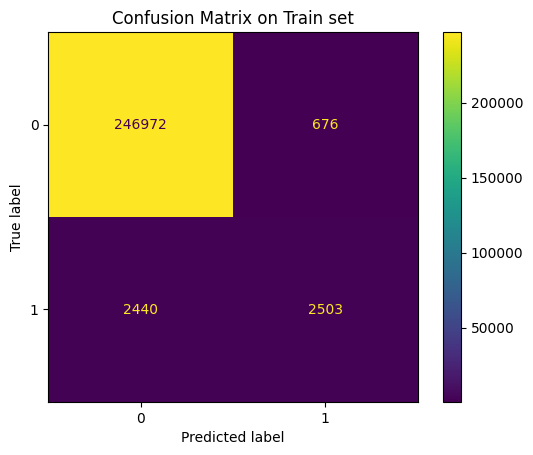

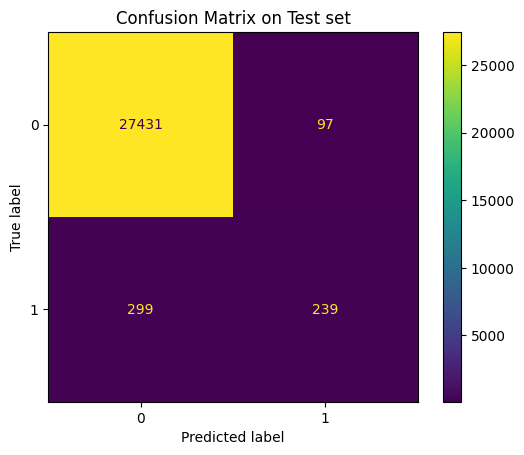

In [ ]:
# Perform grid search
print("Grid search...")
classifier = RandomForestClassifier()

# Grid of values to be tested
params = {
    'max_depth': [2, 4, 6, 8, 10],
    'min_samples_leaf': [1, 2, 5],
    'min_samples_split': [2, 4, 8],
    'n_estimators': [10, 20, 40, 60, 80, 100]
}
gridsearch = GridSearchCV(classifier, param_grid = params, cv = 3) # cv : the number of folds to be used for CV
gridsearch.fit(X_train, Y_train)
print("...Done.")
print("Best hyperparameters : ", gridsearch.best_params_)
print("Best validation accuracy : ", gridsearch.best_score_)

# Predictions on training set
print("Predictions on training set...")
Y_train_pred = gridsearch.predict(X_train)
print("...Done.")
print(Y_train_pred)
print()

# It's also possible to get the probabilities estimated by the model:
print("Probabilities on training set...")
Y_train_proba = gridsearch.predict_proba(X_train)
print("...Done.")
print(Y_train_proba)
print()

# Predictions on test set
print("Predictions on test set...")
Y_test_pred = gridsearch.predict(X_test)
print("...Done.")
print(Y_test_pred)
print()

# It's also possible to get the probabilities estimated by the model:
print("Probabilities on test set...")
Y_test_proba = gridsearch.predict_proba(X_test)
print("...Done.")
print(Y_test_proba)
print()


print("f1-score on training set : ", f1_score(Y_train, Y_train_pred))
print("f1-score on test set : ", f1_score(Y_test, Y_test_pred))
print()

# Visualize confusion matrices
_ , ax = plt.subplots() # Get subplot from matplotlib
ax.set(title="Confusion Matrix on Train set") # Set a title that we will add into ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(gridsearch, X_train, Y_train, ax=ax) # ConfusionMatrixDisplay from sklearn
plt.show()

_ , ax = plt.subplots() # Get subplot from matplotlib
ax.set(title="Confusion Matrix on Test set") # Set a title that we will add into ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(gridsearch, X_test, Y_test, ax=ax) # ConfusionMatrixDisplay from sklearn
plt.show()

scores_train=cross_val_score(classifier,X_train,Y_train,scoring='f1',cv=5)
print(f"f1_score mean for train set :{scores_train.mean()}")
print(f"f1_score std for train set :{scores_train.std()}")


scores_test=cross_val_score(classifier,X_test,Y_test,scoring='f1',cv=5)
print(f"f1_score mean for train set :{scores_test.mean()}")
print(f"f1_score std for train set :{scores_test.std()}")

Avec le random forest les scores sont meilleurs.

## regression logistique avec bagging 

On utilise la recherche par grille pour optimiser les hyperparamètres d'un modèle de Bagging basé sur la régression logistique en reprenant les paramètres optimaux trouvés par la grisearch en amont, puis on évalue les performances du modèle optimisé sur des données d'entraînement et de test en utilisant la métrique f1.

In [78]:
classifier = LogisticRegression(C=1, max_iter= 100, penalty= 'l1', solver= 'liblinear')
bagg_classifier = BaggingClassifier(classifier)

params={
    'n_estimators':[20],
    'base_estimator__C': [0.07]
}

gridsearch=GridSearchCV(bagg_classifier, param_grid=params, scoring='f1', cv=5, verbose=2)
gridsearch.fit(X_train,Y_train)


Fitting 5 folds for each of 1 candidates, totalling 5 fits


/home/amandine/mambaforge/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:720: FutureWarning:

Parameter 'base_estimator' of BaggingClassifier is deprecated in favor of 'estimator'. See BaggingClassifier's docstring for more details.



[CV] END ............base_estimator__C=0.07, n_estimators=20; total time=  59.4s


/home/amandine/mambaforge/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:720: FutureWarning:

Parameter 'base_estimator' of BaggingClassifier is deprecated in favor of 'estimator'. See BaggingClassifier's docstring for more details.



[CV] END ............base_estimator__C=0.07, n_estimators=20; total time= 1.2min


/home/amandine/mambaforge/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:720: FutureWarning:

Parameter 'base_estimator' of BaggingClassifier is deprecated in favor of 'estimator'. See BaggingClassifier's docstring for more details.



[CV] END ............base_estimator__C=0.07, n_estimators=20; total time= 1.2min


/home/amandine/mambaforge/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:720: FutureWarning:

Parameter 'base_estimator' of BaggingClassifier is deprecated in favor of 'estimator'. See BaggingClassifier's docstring for more details.



[CV] END ............base_estimator__C=0.07, n_estimators=20; total time= 1.2min


/home/amandine/mambaforge/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:720: FutureWarning:

Parameter 'base_estimator' of BaggingClassifier is deprecated in favor of 'estimator'. See BaggingClassifier's docstring for more details.



[CV] END ............base_estimator__C=0.07, n_estimators=20; total time= 1.1min


/home/amandine/mambaforge/lib/python3.10/site-packages/sklearn/model_selection/_search.py:929: FutureWarning:

Parameter 'base_estimator' of BaggingClassifier is deprecated in favor of 'estimator'. See BaggingClassifier's docstring for more details.



0.9857478799971495

In [79]:
print(gridsearch.best_params_)
print(gridsearch.best_estimator_.score(X_train,Y_train))
print(gridsearch.best_estimator_.score(X_test,Y_test))

{'base_estimator__C': 0.07, 'n_estimators': 20}
0.9867612068521839
0.9857478799971495


Le modèle Bagging avec les meilleurs hyperparamètres a une très bonne performance en termes de précision, à la fois sur les données d'entraînement et de test. 

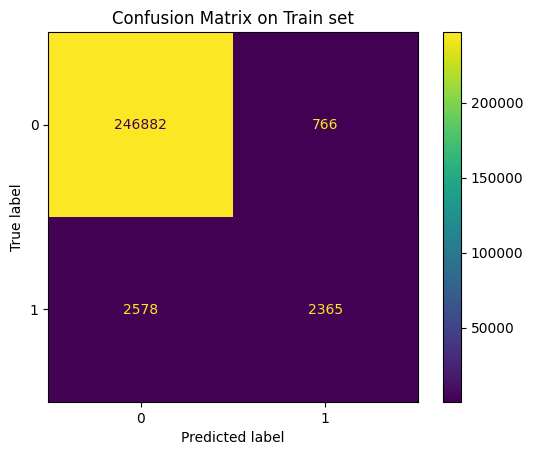

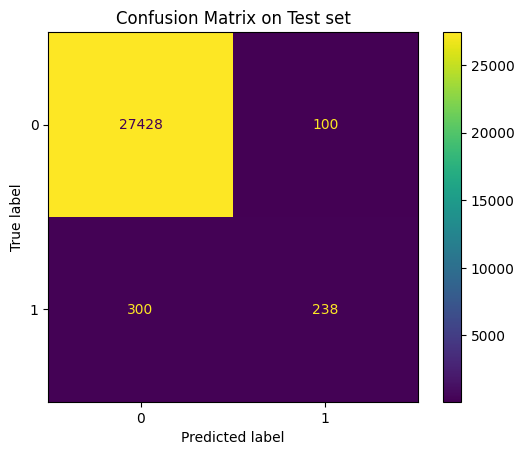

In [80]:
# Visualize confusion matrices
_ , ax = plt.subplots() # Get subplot from matplotlib
ax.set(title="Confusion Matrix on Train set") # Set a title that we will add into ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(gridsearch, X_train, Y_train, ax=ax) # ConfusionMatrixDisplay from sklearn
plt.show()

_ , ax = plt.subplots() # Get subplot from matplotlib
ax.set(title="Confusion Matrix on Test set") # Set a title that we will add into ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(gridsearch, X_test, Y_test, ax=ax) # ConfusionMatrixDisplay from sklearn
plt.show()
scores_train=cross_val_score(gridsearch.best_estimator_,X_train,Y_train,scoring='f1',cv=5)
print(f"f1_score mean for train set :{scores_train.mean()}")
print(f"f1_score std for train set :{scores_train.std()}")


scores_test=cross_val_score(gridsearch.best_estimator_,X_test,Y_test,scoring='f1',cv=5)
print(f"f1_score mean for train set :{scores_test.mean()}")
print(f"f1_score std for train set :{scores_test.std()}")